<a href="https://colab.research.google.com/github/Naditya206/PCVK/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import library dasar
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


Mounted at /content/drive


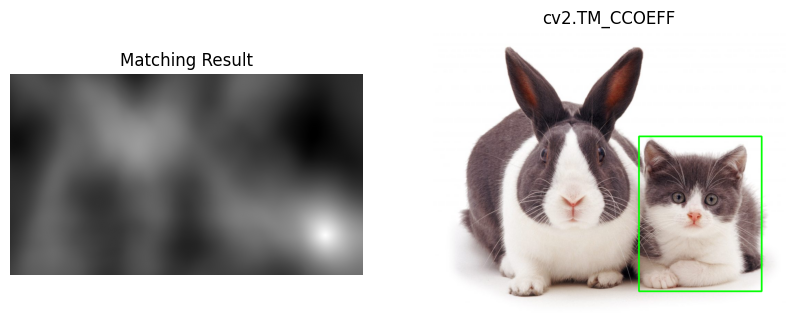

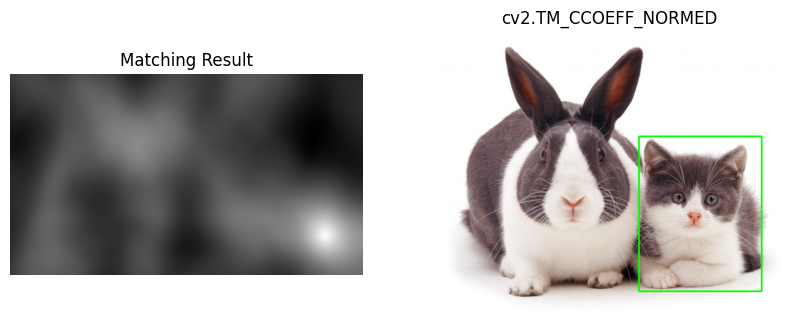

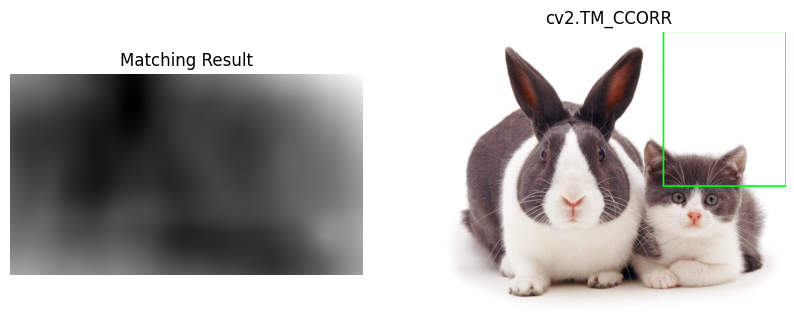

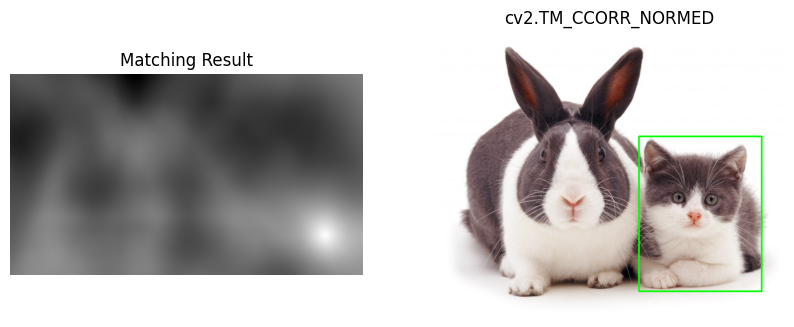

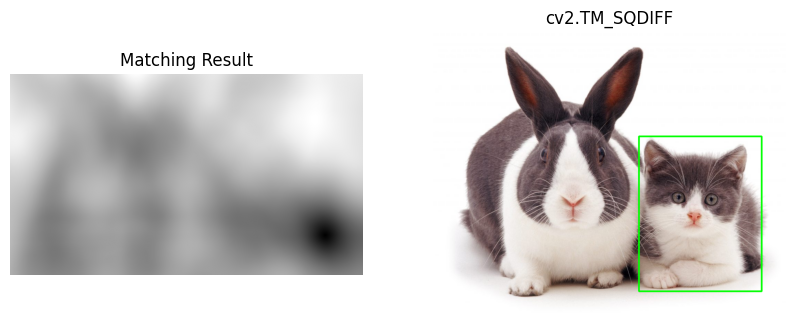

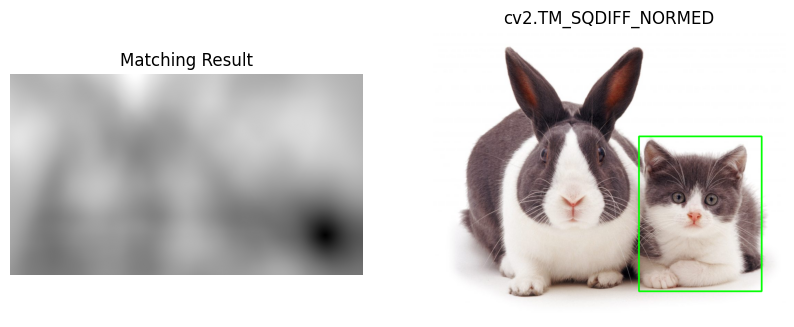

In [3]:
# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load gambar dan template dalam mode BERWARNA
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cats_and_bunnies.jpg')
template = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/cat2_templatejpg.jpg')

# Ubah template ke grayscale untuk matching, tapi simpan versi berwarna untuk visualisasi
template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

w, h = template_gray.shape[::-1]

methods = [
    'cv2.TM_CCOEFF',
    'cv2.TM_CCOEFF_NORMED',
    'cv2.TM_CCORR',
    'cv2.TM_CCORR_NORMED',
    'cv2.TM_SQDIFF',
    'cv2.TM_SQDIFF_NORMED'
]

for meth in methods:
    img2 = img.copy()
    method = eval(meth)
    res = cv2.matchTemplate(img_gray, template_gray, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # Pilih titik top-left sesuai metode
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(img2, top_left, bottom_right, (0, 255, 0), 3)  # Warna hijau

    plt.figure(figsize=(10, 4))
    plt.subplot(121), plt.imshow(res, cmap='gray')
    plt.title('Matching Result'), plt.axis('off')

    # Konversi BGR -> RGB agar warna tampil benar di matplotlib
    plt.subplot(122), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title(meth), plt.axis('off')

    plt.show()


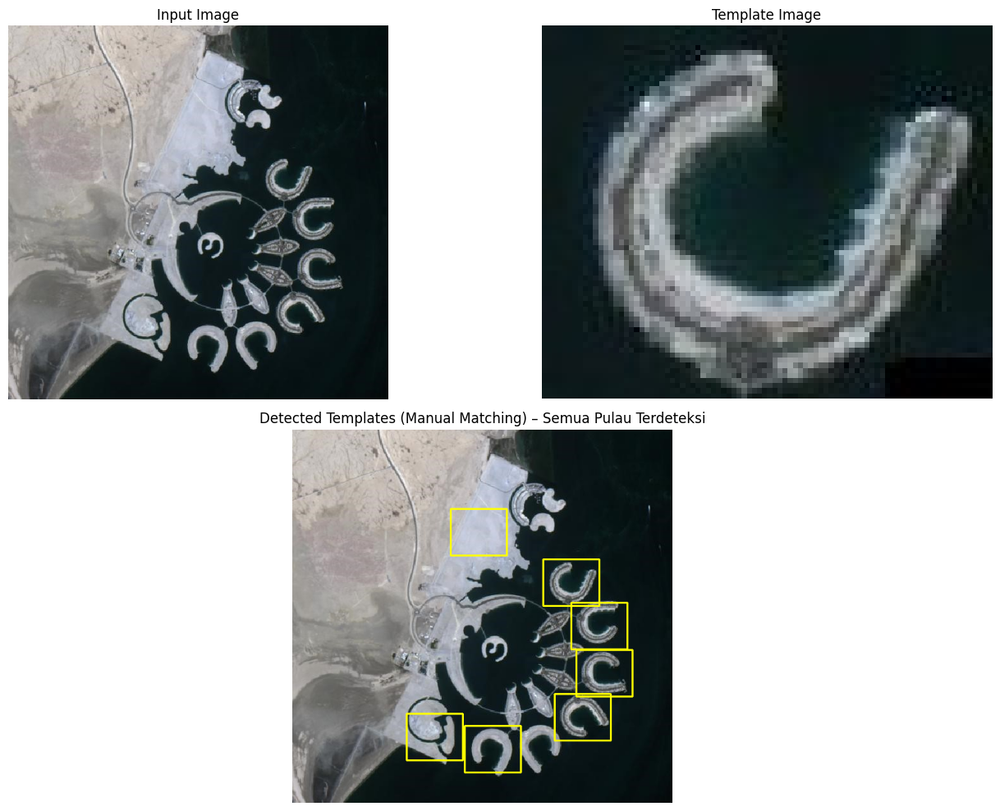

Jumlah kotak terdeteksi: 7


In [4]:
# Final perfect version: detect all crescent islands
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate2d
import math

# Path gambar
img_path = '/content/drive/MyDrive/PCVK/Images/Object Detection/bahrain.jpg'
tpl_path = '/content/drive/MyDrive/PCVK/Images/Object Detection/bahrain-template.jpg'

# Load gambar
img_color = cv2.imread(img_path)
tpl_color = cv2.imread(tpl_path)
if img_color is None or tpl_color is None:
    raise FileNotFoundError("Pastikan path gambar benar dan Drive sudah di-mount!")

img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY).astype(np.float64)
tpl_gray = cv2.cvtColor(tpl_color, cv2.COLOR_BGR2GRAY).astype(np.float64)

H, W = img_gray.shape
h, w = tpl_gray.shape
n = h * w

# --- Normalized Cross-Correlation (NCC) ---
tpl_zero = tpl_gray - np.mean(tpl_gray)
tpl_std = np.std(tpl_zero)
tpl_std = 1e-6 if tpl_std == 0 else tpl_std

num = correlate2d(img_gray, tpl_zero, mode='valid')
ones = np.ones((h, w))
sum_patch = correlate2d(img_gray, ones, mode='valid')
sum_patch_sq = correlate2d(img_gray**2, ones, mode='valid')
mean_patch = sum_patch / n
std_patch = np.sqrt(sum_patch_sq / n - mean_patch**2)
std_patch[std_patch == 0] = 1e-6

ncc = num / (std_patch * tpl_std)

# --- Parameter deteksi (disesuaikan) ---
threshold = 0.55     # lebih rendah supaya semua 6-7 objek muncul
ys, xs = np.where(ncc >= threshold)

# --- Buat kandidat kotak ---
candidates = [(ncc[y, x], x, y, x + w, y + h) for y, x in zip(ys, xs)]

# --- Non-Maximum Suppression (lebih longgar) ---
def iou(boxA, boxB):
    xA, yA = max(boxA[0], boxB[0]), max(boxA[1], boxB[1])
    xB, yB = min(boxA[2], boxB[2]), min(boxA[3], boxB[3])
    interW, interH = max(0, xB - xA), max(0, yB - yA)
    interArea = interW * interH
    areaA = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    areaB = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    denom = areaA + areaB - interArea
    return interArea / denom if denom > 0 else 0

candidates.sort(key=lambda x: x[0], reverse=True)
kept = []
iou_thresh = 0.02  # longgarkan jarak antar kotak agar semuanya masuk

for score, x1, y1, x2, y2 in candidates:
    box = (x1, y1, x2, y2)
    if all(iou(box, k) <= iou_thresh for k in kept):
        kept.append(box)
    if len(kept) >= 7:   # stop setelah 7 deteksi (semua pulau)
        break

# --- Gambar hasil deteksi ---
output = img_color.copy()
for (x1, y1, x2, y2) in kept:
    cv2.rectangle(output, (x1, y1), (x2, y2), (0, 255, 255), 2)

# --- Visualisasi akhir ---
plt.figure(figsize=(14,10))
plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
plt.title("Input Image")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(cv2.cvtColor(tpl_color, cv2.COLOR_BGR2RGB))
plt.title("Template Image")
plt.axis("off")

plt.subplot(2,1,2)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title("Detected Templates (Manual Matching) – Semua Pulau Terdeteksi")
plt.axis("off")
plt.tight_layout()
plt.show()

print("Jumlah kotak terdeteksi:", len(kept))


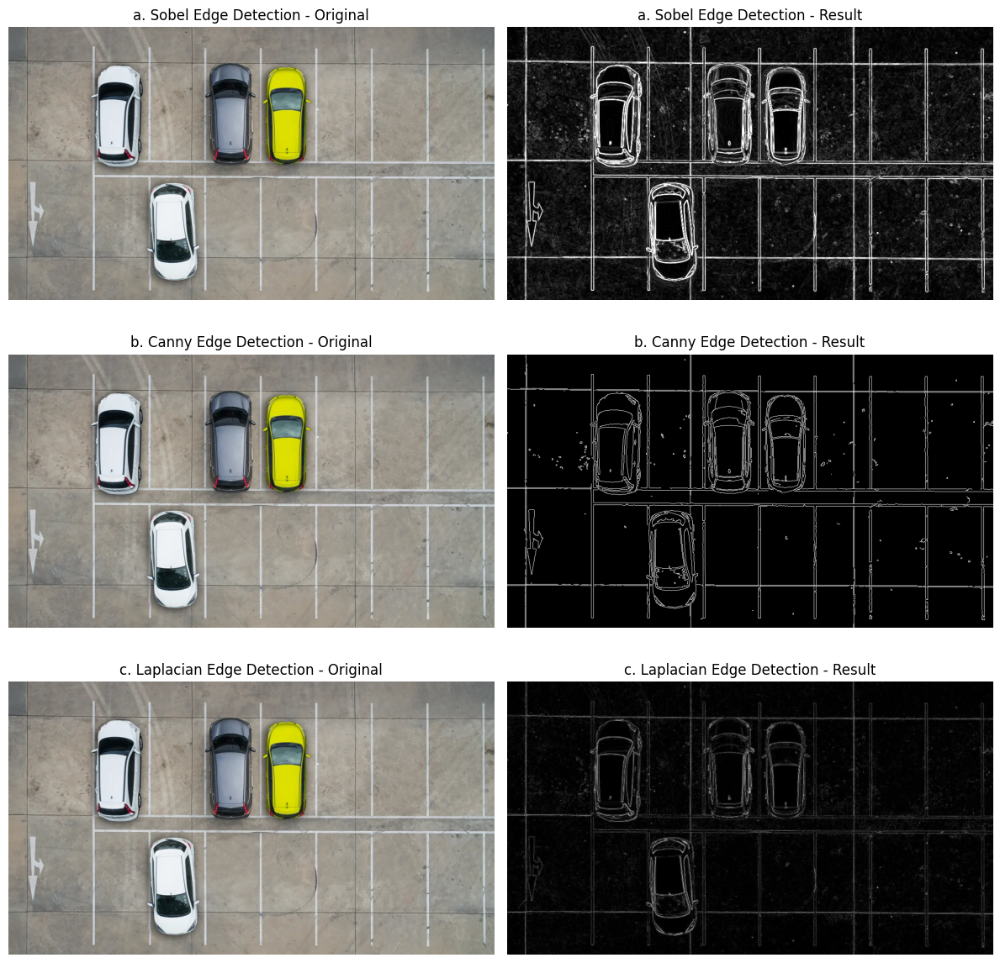

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# === Load gambar (berwarna dan grayscale) ===
img_color = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/car-park.jpg')
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

# === a. Sobel Edge Detection ===
sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobelx, sobely)
sobel = cv2.convertScaleAbs(sobel)

# === b. Canny Edge Detection ===
canny = cv2.Canny(img_gray, 100, 200)

# === c. Laplacian Edge Detection ===
laplacian = cv2.Laplacian(img_gray, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

# === Plot hasil seperti di modul ===
plt.figure(figsize=(12,12))

# Sobel
plt.subplot(3,2,1)
plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
plt.title('a. Sobel Edge Detection - Original')
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(sobel, cmap='gray')
plt.title('a. Sobel Edge Detection - Result')
plt.axis('off')

# Canny
plt.subplot(3,2,3)
plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
plt.title('b. Canny Edge Detection - Original')
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(canny, cmap='gray')
plt.title('b. Canny Edge Detection - Result')
plt.axis('off')

# Laplacian
plt.subplot(3,2,5)
plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
plt.title('c. Laplacian Edge Detection - Original')
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(laplacian, cmap='gray')
plt.title('c. Laplacian Edge Detection - Result')
plt.axis('off')

plt.tight_layout()
plt.show()


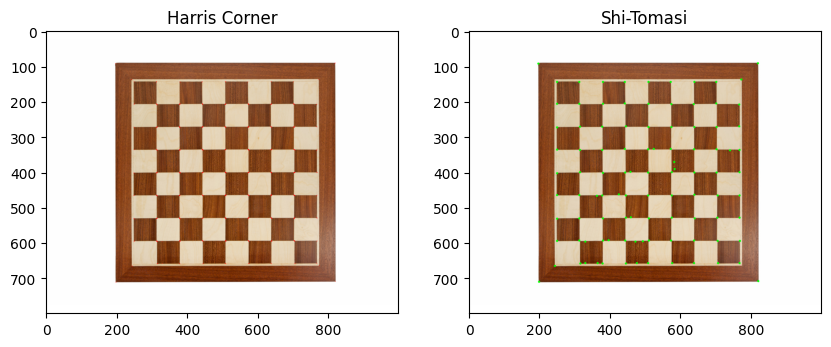

In [6]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/chess-board.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Harris Corner
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)
img_harris = img.copy()
img_harris[dst > 0.01 * dst.max()] = [0, 0, 255]

# Shi-Tomasi
corners = cv2.goodFeaturesToTrack(gray, 100, 0.01, 10)
img_shi = img.copy()
for c in corners:
    x, y = c.ravel()
    cv2.circle(img_shi, (int(x), int(y)), 3, (0, 255, 0), -1)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(cv2.cvtColor(img_harris, cv2.COLOR_BGR2RGB)); plt.title("Harris Corner")
plt.subplot(1,2,2); plt.imshow(cv2.cvtColor(img_shi, cv2.COLOR_BGR2RGB)); plt.title("Shi-Tomasi")
plt.show()


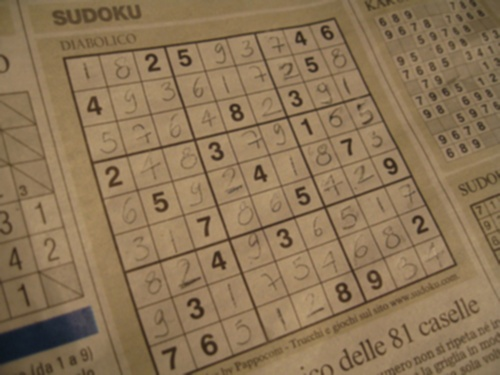

✅ Jumlah garis awal: 33
✅ Jumlah garis setelah filter: 20


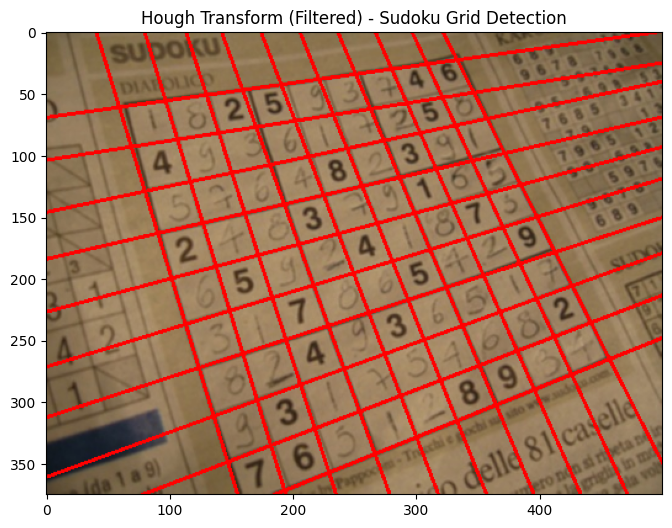

In [7]:
# ============================================
# Hough Line Transform dengan Filter untuk Sudoku Grid
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# 1️⃣ Load image
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/sudoku.jpg')
cv2_imshow(img)

# 2️⃣ Grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3️⃣ Deteksi tepi dengan Canny
edges = cv2.Canny(gray, 90, 150, apertureSize=3)

# 4️⃣ Perbaiki hasil tepi (dilate & erode)
edges = cv2.dilate(edges, np.ones((3, 3), np.uint8), iterations=1)
edges = cv2.erode(edges, np.ones((5, 5), np.uint8), iterations=1)

# 5️⃣ Deteksi garis dengan Hough Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, 150)

if lines is None or not lines.any():
    print('❌ Tidak ada garis terdeteksi.')
else:
    print('✅ Jumlah garis awal:', len(lines))

# 6️⃣ Aktifkan filter duplikasi garis
apply_filter = True
rho_threshold = 15
theta_threshold = 0.1

# 7️⃣ Filter garis yang mirip (supaya tidak terlalu padat)
if apply_filter:
    similar_lines = {i: [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(i + 1, len(lines)):
            rho_i, theta_i = lines[i][0]
            rho_j, theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    indices = sorted(range(len(lines)), key=lambda x: len(similar_lines[x]))
    line_flags = [True] * len(lines)

    for i in range(len(lines)):
        if not line_flags[indices[i]]:
            continue
        for j in similar_lines[indices[i]]:
            line_flags[j] = False

    filtered_lines = [lines[i] for i in range(len(lines)) if line_flags[i]]
    print('✅ Jumlah garis setelah filter:', len(filtered_lines))
else:
    filtered_lines = lines

# 8️⃣ Gambar garis hasil filter pada gambar asli
img_result = img.copy()
for line in filtered_lines:
    rho, theta = line[0]
    a, b = np.cos(theta), np.sin(theta)
    x0, y0 = a * rho, b * rho
    x1, y1 = int(x0 + 1000 * (-b)), int(y0 + 1000 * (a))
    x2, y2 = int(x0 - 1000 * (-b)), int(y0 - 1000 * (a))
    cv2.line(img_result, (x1, y1), (x2, y2), (0, 0, 255), 2)

# 9️⃣ Tampilkan hasil akhir
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB))
plt.title("Hough Transform (Filtered) - Sudoku Grid Detection")
plt.axis('on')
plt.show()


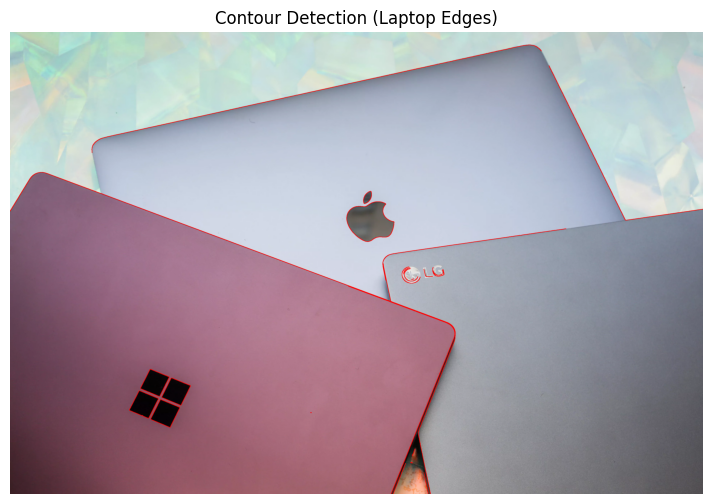

In [8]:
import cv2
import matplotlib.pyplot as plt

# 1️⃣ Baca gambar
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/Object Detection/laptop.jpg')

# 2️⃣ Ubah ke grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3️⃣ Gunakan Gaussian Blur untuk mengurangi noise
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# 4️⃣ Gunakan edge detection (Canny) agar tepi lebih jelas
edges = cv2.Canny(blur, 100, 200)

# 5️⃣ Temukan kontur dari hasil tepi
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 6️⃣ Salin gambar asli dan gambar kontur merah
img_contour = img.copy()
cv2.drawContours(img_contour, contours, -1, (0, 0, 255), 2)  # warna merah (BGR)

# 7️⃣ Tampilkan hasil
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(img_contour, cv2.COLOR_BGR2RGB))
plt.title("Contour Detection (Laptop Edges)")
plt.axis('off')
plt.show()


In [9]:
# Jalankan di cell baru Google Colab
!wget -q https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt
!wget -q https://raw.githubusercontent.com/opencv/opencv_3rdparty/master/dnn_models/res10_300x300_ssd_iter_140000.caffemodel


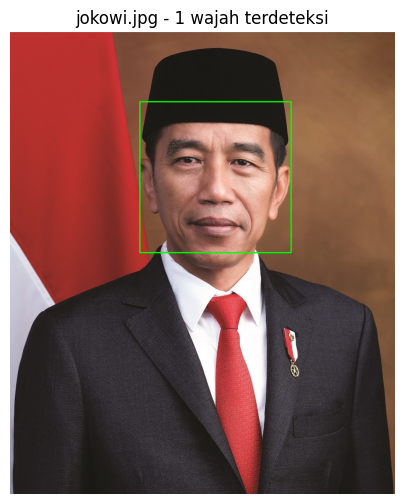

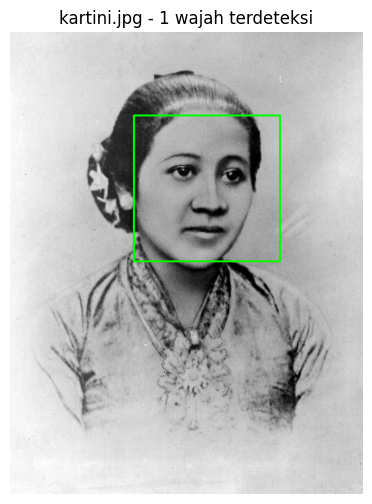

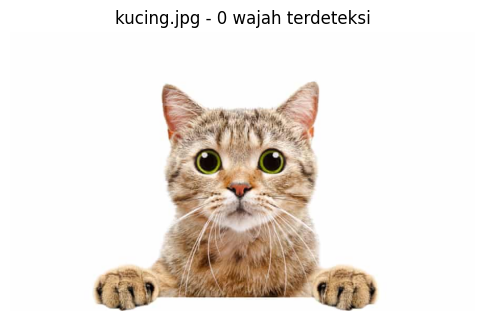

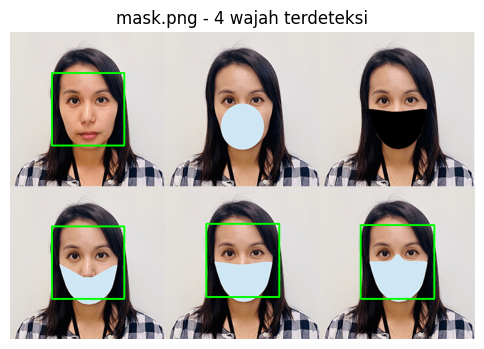

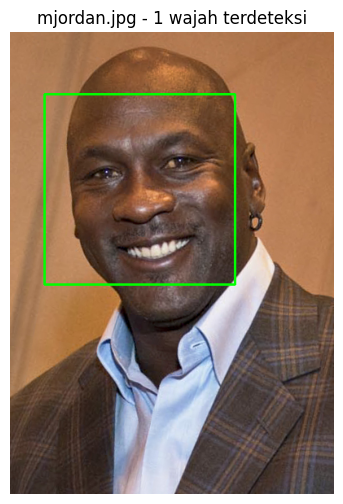

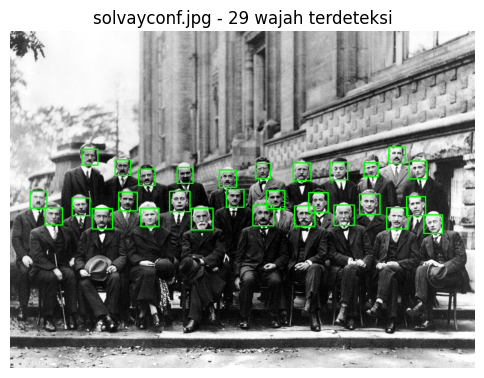

In [10]:
import cv2
import matplotlib.pyplot as plt

# --- Load Haar Cascade ---
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + 'haarcascade_frontalface_alt2.xml'
)

# --- Fungsi menghapus deteksi tumpang tindih (duplikat) ---
def remove_overlaps(faces, overlapThresh=0.4):
    if len(faces) == 0:
        return []
    faces = sorted(faces, key=lambda x: x[2]*x[3], reverse=True)  # besar → kecil
    picked = []
    for (x, y, w, h) in faces:
        keep = True
        for (x2, y2, w2, h2) in picked:
            # Hitung area overlap
            xx1, yy1 = max(x, x2), max(y, y2)
            xx2, yy2 = min(x + w, x2 + w2), min(y + h, y2 + h2)
            interArea = max(0, xx2 - xx1) * max(0, yy2 - yy1)
            area = w * h + w2 * h2 - interArea
            if area > 0 and interArea / area > overlapThresh:
                keep = False
                break
        if keep:
            picked.append((x, y, w, h))
    return picked

# --- Path gambar ---
image_paths = [
    "/content/drive/MyDrive/PCVK/Images/facedet/jokowi.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/kartini.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/kucing.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/mask.png",
    "/content/drive/MyDrive/PCVK/Images/facedet/mjordan.jpg",
    "/content/drive/MyDrive/PCVK/Images/facedet/solvayconf.jpg"
]

# --- Loop deteksi untuk setiap gambar ---
for path in image_paths:
    img = cv2.imread(path)
    if img is None:
        print(f"Gagal membaca {path}")
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)  # perbaiki kontras

    # --- Deteksi wajah ---
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.05,
        minNeighbors=6,   # lebih ketat → hilangkan duplikat
        minSize=(25, 25)
    )

    # --- Hapus wajah duplikat (overlap tinggi) ---
    faces = remove_overlaps(faces, overlapThresh=0.4)

    # --- Gambar hasil ---
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.title(f"{path.split('/')[-1]} - {len(faces)} wajah terdeteksi")
    plt.axis("off")
    plt.show()


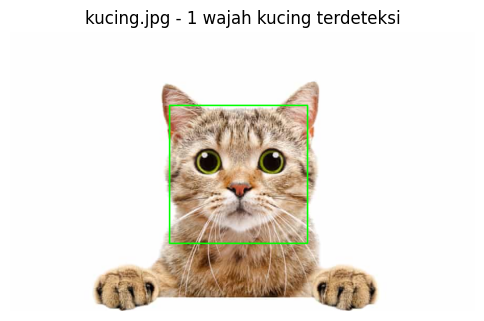

In [11]:
# --- DETEKSI WAJAH KUCING dengan OpenCV ---

import cv2
import matplotlib.pyplot as plt

# Path gambar kucing
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/kucing.jpg"

# Baca gambar dan ubah ke grayscale
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gunakan Haar Cascade khusus wajah kucing
cat_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalcatface_extended.xml')

# Deteksi wajah kucing
faces = cat_cascade.detectMultiScale(
    gray,
    scaleFactor=1.02,   # deteksi halus
    minNeighbors=2,     # longgar agar wajah kecil tetap terdeteksi
    minSize=(75, 75)    # ukuran minimum wajah
)

# Gambar rectangle di sekitar wajah kucing
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Konversi ke RGB untuk tampil dengan matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Tampilkan hasil
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.title(f"kucing.jpg - {len(faces)} wajah kucing terdeteksi")
plt.axis("off")
plt.show()


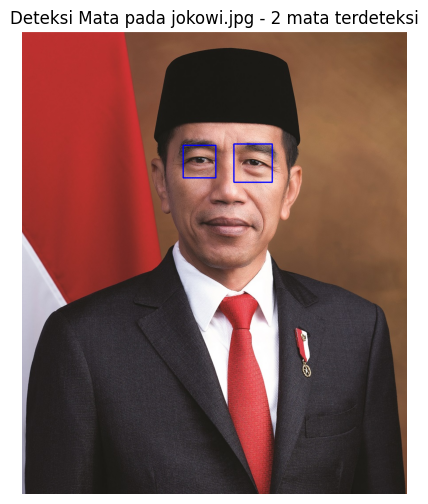

In [12]:
# --- DETEKSI MATA SAJA (tanpa deteksi wajah) ---

import cv2
import matplotlib.pyplot as plt

# Path gambar
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/jokowi.jpg"

# Baca gambar dan ubah ke grayscale
img = cv2.imread(img_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Load classifier untuk mata
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# Deteksi mata
eyes = eye_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=8,
    minSize=(30, 30)
)

# Gambar kotak biru di area mata
for (x, y, w, h) in eyes:
    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

# Konversi ke RGB agar tampil benar di matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Tampilkan hasil
plt.figure(figsize=(6, 6))
plt.imshow(img_rgb)
plt.title(f"Deteksi Mata pada jokowi.jpg - {len(eyes)} mata terdeteksi")
plt.axis("off")
plt.show()


In [13]:
!pip install deepface

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.3/128.3 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 46.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 64.7 MB/s eta 0:00:00


25-11-09 10:57:18 - Directory /root/.deepface has been created
25-11-09 10:57:18 - Directory /root/.deepface/weights has been created
25-11-09 10:57:19 - 🔗 facial_expression_model_weights.h5 will be downloaded from https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5 to /root/.deepface/weights/facial_expression_model_weights.h5...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 103MB/s]


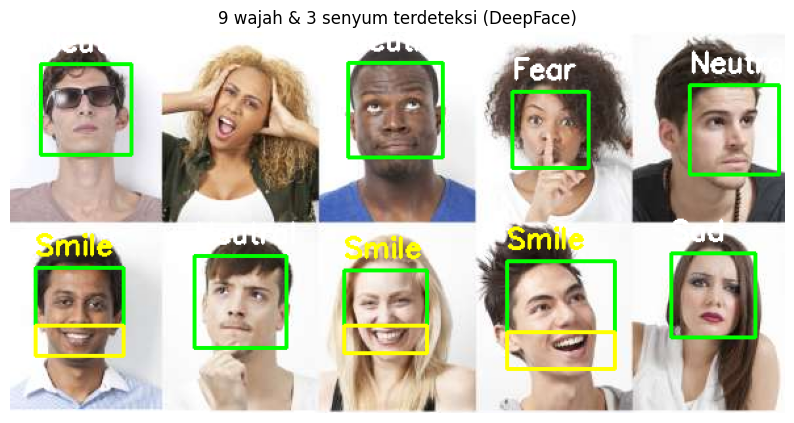

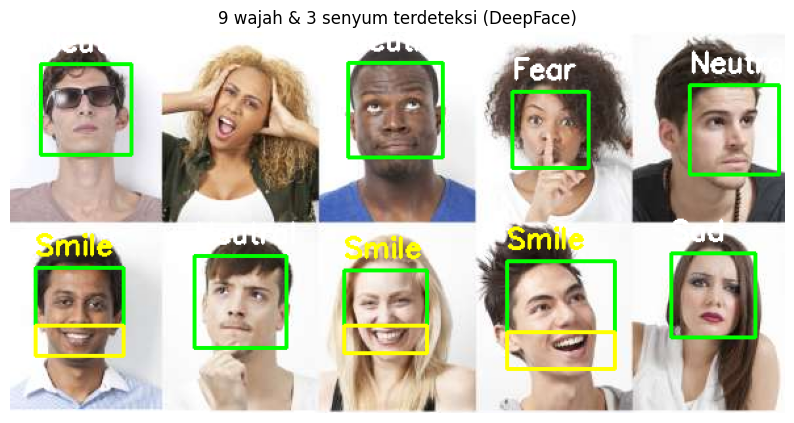

In [14]:
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

# Path gambar
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/smilepeople.jpg"

# Baca gambar
img = cv2.imread(img_path)
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan! Periksa kembali path-nya.")

# Analisis emosi wajah
results = DeepFace.analyze(
    img_path=img_path,
    actions=['emotion'],
    enforce_detection=False
)

# Jika hanya satu wajah, ubah jadi list agar bisa di-loop
if not isinstance(results, list):
    results = [results]

total_faces = len(results)
total_smiles = 0

# Proses tiap wajah
for face in results:
    region = face.get("region", {})
    if not region:
        continue

    # Ambil nilai x, y, w, h dengan aman
    x = region.get("x", 0)
    y = region.get("y", 0)
    w = region.get("w", 0)
    h = region.get("h", 0)

    emotion = face.get("dominant_emotion", "")

    # Kotak hijau untuk wajah
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Jika senyum (happy), tandai area mulut
    if emotion == 'happy':
        total_smiles += 1
        mouth_y = y + int(h * 2 / 3)
        cv2.rectangle(img, (x, mouth_y), (x + w, y + h), (0, 255, 255), 2)
        cv2.putText(img, "Smile", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
    else:
        cv2.putText(img, emotion.capitalize(), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

# Tampilkan hasil
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 6))
plt.imshow(img_rgb)
plt.title(f"{total_faces} wajah & {total_smiles} senyum terdeteksi (DeepFace)")
plt.axis("off")
plt.show()
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

# Path gambar
img_path = "/content/drive/MyDrive/PCVK/Images/facedet/smilepeople.jpg"

# Baca gambar
img = cv2.imread(img_path)
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan! Periksa kembali path-nya.")

# Analisis emosi wajah
results = DeepFace.analyze(
    img_path=img_path,
    actions=['emotion'],
    enforce_detection=False
)

# Jika hanya satu wajah, ubah jadi list agar bisa di-loop
if not isinstance(results, list):
    results = [results]

total_faces = len(results)
total_smiles = 0

# Proses tiap wajah
for face in results:
    region = face.get("region", {})
    if not region:
        continue

    # Ambil nilai x, y, w, h dengan aman
    x = region.get("x", 0)
    y = region.get("y", 0)
    w = region.get("w", 0)
    h = region.get("h", 0)

    emotion = face.get("dominant_emotion", "")

    # Kotak hijau untuk wajah
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Jika senyum (happy), tandai area mulut
    if emotion == 'happy':
        total_smiles += 1
        mouth_y = y + int(h * 2 / 3)
        cv2.rectangle(img, (x, mouth_y), (x + w, y + h), (0, 255, 255), 2)
        cv2.putText(img, "Smile", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
    else:
        cv2.putText(img, emotion.capitalize(), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

# Tampilkan hasil
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 6))
plt.imshow(img_rgb)
plt.title(f"{total_faces} wajah & {total_smiles} senyum terdeteksi (DeepFace)")
plt.axis("off")
plt.show()


In [15]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

In [16]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [17]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

In [18]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640)
Saved to photo.jpg


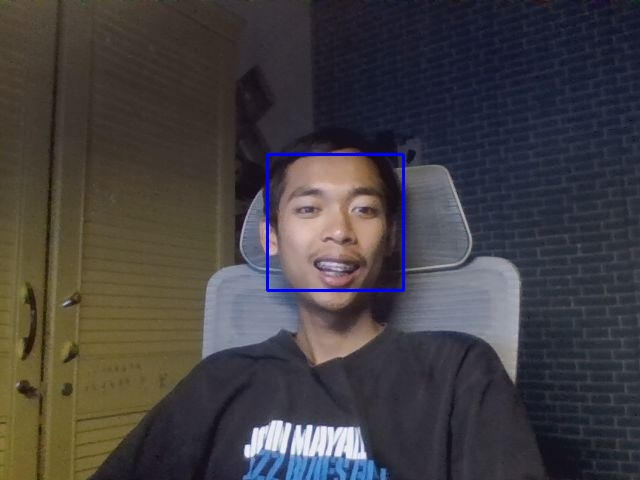

In [19]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [20]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [23]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    faces = face_cascade.detectMultiScale(gray)
    # get face bounding box for overlay
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

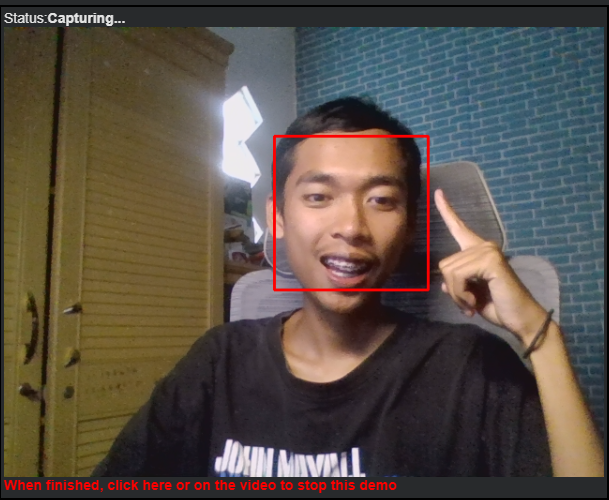

In [24]:
video_stream()
label_html = 'Capturing...'
bbox = ''
count = 0

while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # konversi hasil JS ke gambar OpenCV (RGB)
    img = js_to_image(js_reply["img"])
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # deteksi wajah
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    for (x, y, w, h) in faces:
        # pastikan ROI aman
        h_img, w_img = gray.shape
        x_end = min(x + w, w_img)
        y_end = min(y + h, h_img)

        # ambil area wajah dan blur
        face_roi = gray[y:y_end, x:x_end]
        face_blur = cv2.GaussianBlur(face_roi, (51, 51), 30)
        gray[y:y_end, x:x_end] = face_blur

        # gambar kotak (putih) di sekitar wajah
        cv2.rectangle(gray, (x, y), (x_end, y_end), (255, 255, 255), 2)

    # ubah grayscale ke RGBA agar bisa ditampilkan di stream
    rgba_frame = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGBA)

    # kirim frame hasil grayscale
    bbox_bytes = bbox_to_bytes(rgba_frame)
    bbox = bbox_bytes


<IPython.core.display.Javascript object>

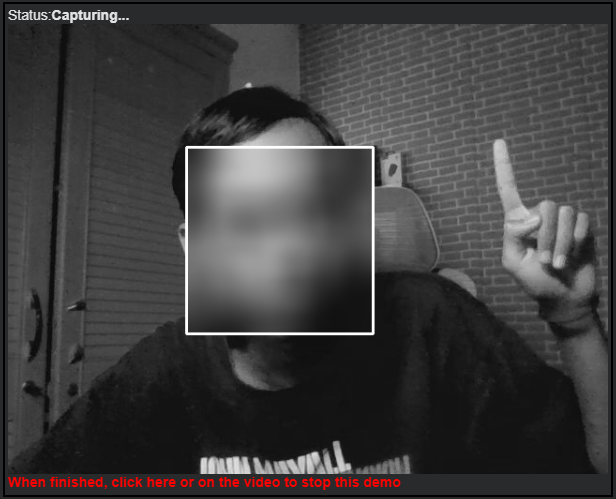

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


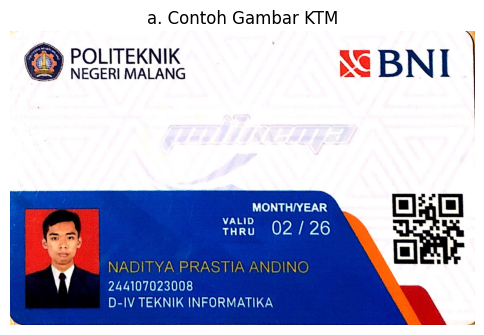

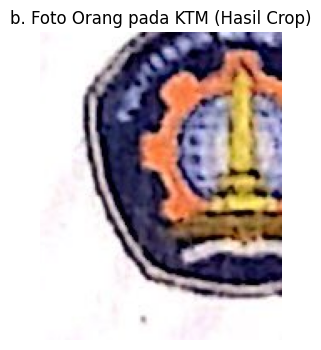

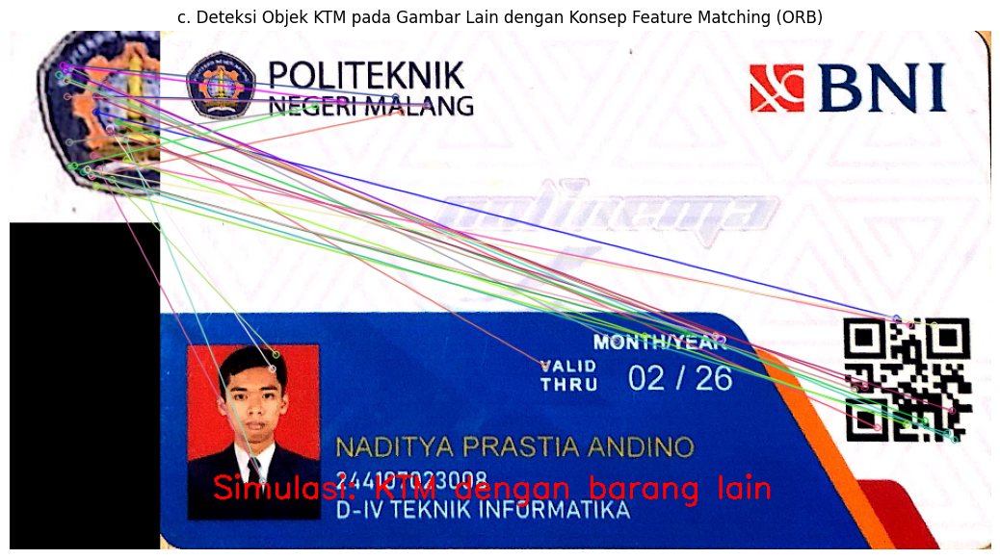

Jumlah keypoints pada Foto KTM : 513
Jumlah keypoints pada Scene     : 1000
Jumlah fitur yang cocok         : 220


In [27]:
# ===============================================
# Tugas: Mengolah gambar KTM dan Deteksi Obyek KTM
# Pengolahan Citra dan Visi Komputer
# ===============================================

# --- Import library ---
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive

# --- Mount Google Drive ---
drive.mount('/content/drive')

# ==========================================================
# a. Menampilkan Gambar KTM (Contoh KTM)
# ==========================================================
img_ktm = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm_naditya.JPG')

if img_ktm is None:
    raise FileNotFoundError("❌ Gambar KTM tidak ditemukan. Pastikan path sudah benar!")

img_ktm_rgb = cv2.cvtColor(img_ktm, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,4))
plt.title("a. Contoh Gambar KTM")
plt.imshow(img_ktm_rgb)
plt.axis('off')
plt.show()

# ==========================================================
# b. Menampilkan Foto Orang pada KTM (hasil crop)
# ==========================================================
# Sesuaikan koordinat area wajah sesuai posisi di KTM kamu
y1, y2 = 85, 270   # tinggi
x1, x2 = 45, 190   # lebar

foto_ktm = img_ktm[y1:y2, x1:x2]
foto_ktm_rgb = cv2.cvtColor(foto_ktm, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(4,4))
plt.title("b. Foto Orang pada KTM (Hasil Crop)")
plt.imshow(foto_ktm_rgb)
plt.axis('off')
plt.show()

# ==========================================================
# c. Deteksi Obyek KTM dengan Konsep Feature Matching
# ==========================================================
# Gambar berisi KTM + barang lain
# Jika kamu punya gambar asli berisi KTM, ganti path di bawah:
scene = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm_dalam_scene.jpg')

# Jika tidak ada gambar lain, buat simulasi (KTM diperbesar + teks tambahan)
if scene is None:
    scene = cv2.resize(img_ktm, (800, 500))
    cv2.putText(scene, "Simulasi: KTM dengan barang lain", (50, 450),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)

scene_rgb = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

# Gunakan ORB (Oriented FAST and Rotated BRIEF)
orb = cv2.ORB_create(1000)

# Deteksi keypoints dan deskriptor
kp1, des1 = orb.detectAndCompute(foto_ktm, None)
kp2, des2 = orb.detectAndCompute(scene, None)

if des1 is None or des2 is None:
    raise ValueError("❌ Tidak ditemukan fitur pada salah satu gambar. Coba ubah area crop atau gambar scene.")

# Gunakan Brute Force Matcher dengan Hamming Distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Gambar hasil matching
hasil_match = cv2.drawMatches(
    foto_ktm, kp1, scene, kp2, matches[:30], None, flags=2
)

plt.figure(figsize=(14,7))
plt.title("c. Deteksi Objek KTM pada Gambar Lain dengan Konsep Feature Matching (ORB)")
plt.imshow(cv2.cvtColor(hasil_match, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# ==========================================================
# Informasi hasil deteksi
# ==========================================================
print("Jumlah keypoints pada Foto KTM :", len(kp1))
print("Jumlah keypoints pada Scene     :", len(kp2))
print("Jumlah fitur yang cocok         :", len(matches))
